<a href="https://colab.research.google.com/github/Luciahelenasantos/POS_GRADUACAO_PUC/blob/main/Machine_Learning%20/mvp-machine-learning-e-analytics/cats_vs_dogs_binaryclassify_dl.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Classificador de imagens binária - Gato VS Cachorro

**Contexto:** Temos um conjunto de imagens que representam duas categorias de animais: gato e cachorro. O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem em alguma das categorias mencionadas acima.

**Estrutura:** O notebook está dividido assim:

1. Importação das bibliotecas
2. Acesso e tratamento dos dados que serão a entrada do modelo de deep learning
3. Configuração do modelo de deep learning usando uma rede neural convolucional (CNN) simples com Keras
4. Treinamento do modelo de deep learning
5. Execução do modelo de deep learning treinado em um subconjunto das imagens de teste
6. Avaliação do modelo de deep learning
7. Exportação do modelo de deep learning
8. Teste do modelo exportado

**Créditos:** O notebook foi adaptado de [MARWAA SHAABAN ABD ELHAKIM](https://www.kaggle.com/code/marwaaabdalhakim/cats-vs-dogs-binaryclassify-dl) e documentado pelos professores:

- Hugo Villamizar
- Patrick Happ

**Dataset:** O dataset foi baixado do Kaggle, uma plataforma online voltada para cientistas de dados, entusiastas de aprendizado de máquina e profissionais afins. O uso é estritamente didático. Para mais informações sobre o dataset, veja o link a seguir: [gato Vs Cachorro kaggle](https://www.kaggle.com/competitions/dogs-vs-cats/data).

## 1. Importando as bibliotecas necessárias para executar o notebook

P.S. Para conseguir executar o notebook é necessário instalar bibliotecas como Tensorflow, keras, scikit-learn. Por exemplo:

`pip install tensorflow`

`pip install keras`

`pip install pandas`

`pip install scikit-learn`

In [1]:
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
import os
from sklearn.model_selection import train_test_split
import shutil
import random
import math
import numpy as np
import zipfile
import pandas as pd
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from datetime import datetime
from tensorflow import keras
from sklearn.metrics import confusion_matrix, classification_report
import sklearn.metrics as skm
import itertools
import numpy as np
import matplotlib.pyplot as plt

#### Utilidades

`plot_confusion_matrix` é uma função python que imprime uma matriz de confusão

In [2]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    Esta função imprime e plota a matriz de confusão.
    A normalização pode ser aplicada definindo `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusão normalizada")
    else:
        print('Matriz de confusão sem normalização')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('Label real')
    plt.xlabel('Label predito')

## 2. Acessando e tratando os dados que serão a entrada do modelo de deep learning

Neste caso, as imagens não estão organizadas em pastas que representam cada classe rotulada (label). Temos um arquivo `.zip` que precisa ser extraído.

In [4]:
# Path onde se encontra o arquivo 'train.zip'
train = 'datasets/dogs_vs_cats/input/dogs-vs-cats/train.zip'
destination = 'datasets/dogs_vs_cats/working/train_images/'

# Criando a pasta de destino se necessário
os.makedirs(destination,exist_ok=True)

with zipfile.ZipFile(train,'r') as zip_ref:
    zip_ref.extractall(destination)

FileNotFoundError: ignored

Verificando a pasta que foi extraída do `.zip`

In [5]:
r='datasets/dogs_vs_cats/working/train_images'
print(os.listdir(r))

[]


Verificando o número de imagens que foram extraídas

In [ ]:
path='datasets/dogs_vs_cats/working/train_images/train/'
print(f"Temos um total de {len(os.listdir(path))} imagens para o treinamento e avaliação do modelo de deep learning")

Temos um total de 25000 imagens para o treinamento e avaliação do modelo de deep learning


Exemplos de algumas imagens extraídas

In [ ]:
print(f"Primeiras 20 imagens: \n {os.listdir(path)[:20]}")

Primeiras 20 imagens: 
 ['dog.8011.jpg', 'cat.5077.jpg', 'dog.7322.jpg', 'cat.2718.jpg', 'cat.10151.jpg', 'cat.3406.jpg', 'dog.1753.jpg', 'cat.4369.jpg', 'cat.7660.jpg', 'dog.5535.jpg', 'cat.8553.jpg', 'cat.9895.jpg', 'cat.1211.jpg', 'dog.3144.jpg', 'dog.775.jpg', 'dog.11102.jpg', 'cat.6218.jpg', 'dog.11664.jpg', 'dog.3622.jpg', 'cat.1577.jpg']


Criando um dataframe com as informações das imagens

In [ ]:
images =os.listdir(path)

labels, heights, widths, channels, filesize = [], [], [], [], []

# Loop que percorre cada uma das imagens extraídas
for fname in images:

    labels.append(str(fname)[:3])
    img_shape = mpimg.imread(path+fname).shape
    heights.append(img_shape[0])
    widths.append(img_shape[1])
    channels.append(img_shape[2])
    filesize.append(os.path.getsize(path+fname))

# Criação do dataset
df = pd.DataFrame({'images': images, 'class': labels, 'height': heights,
                         'width': widths, 'channels': channels, 'filesize': filesize})

Visualização do dataset criado

In [ ]:
df.head()

,images,class,height,width,channels,filesize
0,dog.8011.jpg,dog,500,380,3,28019
1,cat.5077.jpg,cat,300,399,3,19715
2,dog.7322.jpg,dog,120,159,3,4721
3,cat.2718.jpg,cat,480,467,3,41773
4,cat.10151.jpg,cat,375,499,3,11427


Visualização do número de imagens por classe

dog    12500
cat    12500
Name: class, dtype: int64


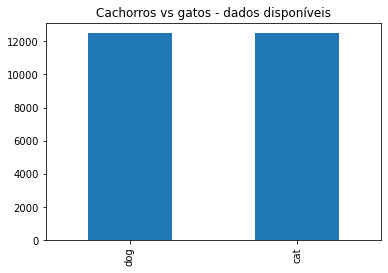

In [ ]:
print((df['class']).value_counts())
dogsVScats_count = df['class'].value_counts().plot.bar(title='Cachorros vs gatos - dados disponíveis')

Visualizando algumas imagens do conjunto de dados

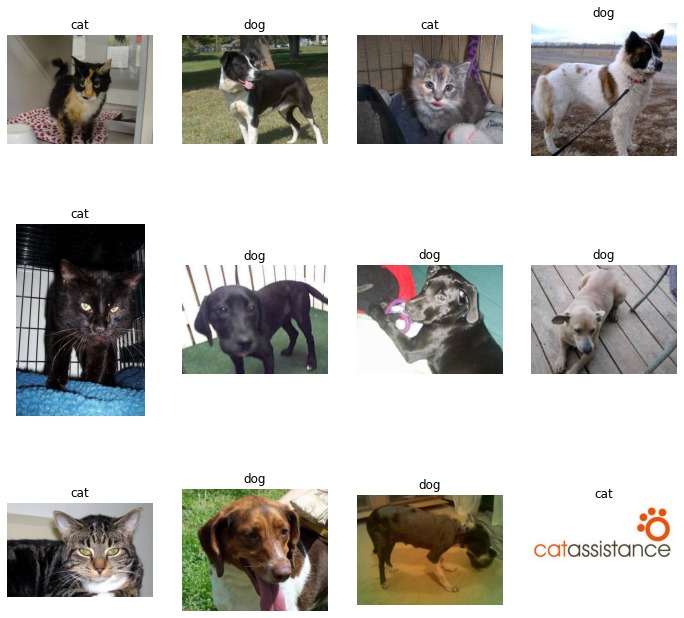

In [ ]:
fig = plt.gcf()
fig.set_size_inches(3*4, 3*4)

# Visualizando apenas 12 imagens
for i in range(12):

    sample = np.random.choice(images)
    img_path =path+sample
    sp = plt.subplot(3, 4, i + 1)
    sp.axis('Off')
    img = mpimg.imread(img_path)
    plt.imshow(img)
    plt.title(sample[:3])

plt.show()

Divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [ ]:
train, test =train_test_split(df[['images' , 'class']] ,test_size=0.3 ,random_state=42 , shuffle=True)

Visualizando a divisão dos dados

In [ ]:
print("##### Train: #####")
print(train)
print("##### Test: #####")
print(test)

##### Train: #####
              images class
4913    dog.9646.jpg   dog
9338   cat.10656.jpg   cat
24211   dog.9288.jpg   dog
18791  cat.12001.jpg   cat
16066   dog.4525.jpg   dog
...              ...   ...
21575   dog.2721.jpg   dog
5390    dog.3974.jpg   dog
860    dog.10427.jpg   dog
15795    cat.731.jpg   cat
23654   dog.6540.jpg   dog

[17500 rows x 2 columns]
##### Test: #####
              images class
6868    cat.1474.jpg   cat
24016  dog.11287.jpg   dog
9668    dog.8276.jpg   dog
13640   cat.7227.jpg   cat
14018   cat.2997.jpg   cat
...              ...   ...
21156   cat.2698.jpg   cat
24654   dog.3388.jpg   dog
14592   cat.8658.jpg   cat
20160    cat.755.jpg   cat
4731    cat.8218.jpg   cat

[7500 rows x 2 columns]


#### Preparação dos dados

`ImageDataGenerator` é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o `ImageDataGenerator` para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método `flow_from_dataframe()` para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes), entre outros.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [ ]:
train_datagen=ImageDataGenerator(validation_split=0.2, #include validation split
                                 rescale = 1.0/255,
                                    rotation_range=40,
                                    shear_range=0.2,
                                    zoom_range=0.2,
                                    horizontal_flip=True,
                                    fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)


train_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='training' #training set
    )

val_generator=train_datagen.flow_from_dataframe(
    train ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',
    subset='validation' #validation set
    )

test_generator=test_datagen.flow_from_dataframe(
    test ,path,
    target_size=(150,150),
    batch_size=50,
    class_mode='binary',
    x_col='images',
    y_col='class',)

Found 14000 validated image filenames belonging to 2 classes.
Found 3500 validated image filenames belonging to 2 classes.
Found 7500 validated image filenames belonging to 2 classes.


Visualizando um exemplo do tratamento das imagens

Found 1 validated image filenames belonging to 1 classes.


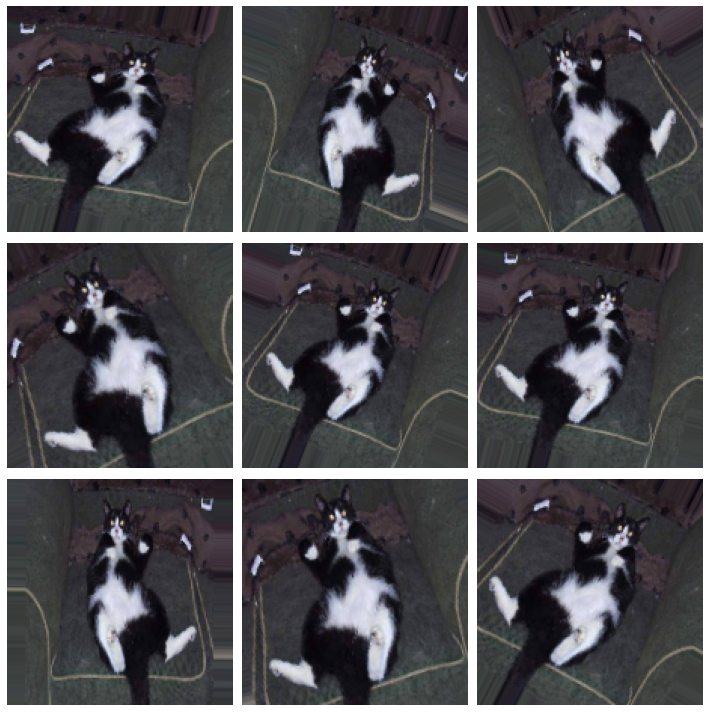

In [ ]:
# Pegando um registro do dataframe
sample = df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    path,
    x_col='images',
    y_col='class',
    target_size=(150,150),
    class_mode='categorical'
)

plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

## 3. Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

#### Definição da arquitetura do modelo

Aqui é especificada uma `camada convolucional 2D` que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação `ReLU`. O parâmetro `input_shape` define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas `max-pooling` com a mesma função de ativação.

In [ ]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [ ]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 15, 15, 128)      

## 4. Treinamento do modelo de deep learning

#### Compilação do modelo Keras com as configurações do treinamento

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='binary_crossentropy'`: especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [ ]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator`.

In [ ]:
history=model.fit_generator(train_generator ,
                            steps_per_epoch=50,
                            epochs=5 ,
                            validation_data=val_generator ,
                            validation_steps=50)

Epoch 1/5
50/50 [==============================] - 52s 1s/step - loss: 0.6942 - accuracy: 0.5148 - val_loss: 0.6827 - val_accuracy: 0.4940
Epoch 2/5
50/50 [==============================] - 50s 1s/step - loss: 0.6919 - accuracy: 0.5340 - val_loss: 0.6705 - val_accuracy: 0.5032
Epoch 3/5
50/50 [==============================] - 56s 1s/step - loss: 0.6896 - accuracy: 0.5220 - val_loss: 0.6783 - val_accuracy: 0.5740
Epoch 4/5
50/50 [==============================] - 52s 1s/step - loss: 0.6816 - accuracy: 0.5612 - val_loss: 0.6443 - val_accuracy: 0.5884
Epoch 5/5
50/50 [==============================] - 54s 1s/step - loss: 0.6642 - accuracy: 0.5848 - val_loss: 0.6047 - val_accuracy: 0.6284


## 5. Execução do modelo treinado em um subconjunto das imagems de teste
Idealmente se deseja realizar a inferência sobre todo o conjunto de teste, porém para efeitos de agilidade, executamos apenas em um subconjunto de imagens.

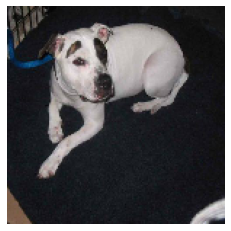

Label:  dog
Previsão:  cat
Probabilidade:  0.46480048


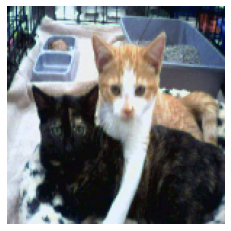

Label:  cat
Previsão:  cat
Probabilidade:  0.39482927


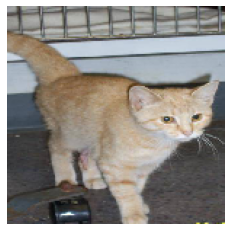

Label:  cat
Previsão:  cat
Probabilidade:  0.4861164


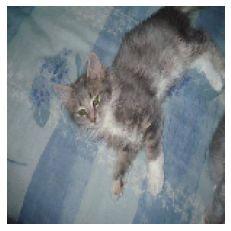

Label:  cat
Previsão:  cat
Probabilidade:  0.47017908


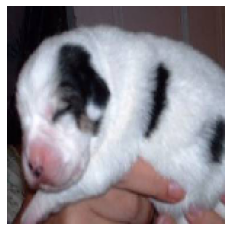

Label:  dog
Previsão:  cat
Probabilidade:  0.452084


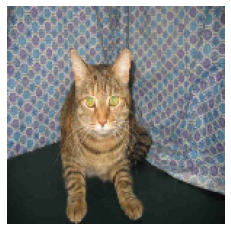

Label:  cat
Previsão:  dog
Probabilidade:  0.50337255


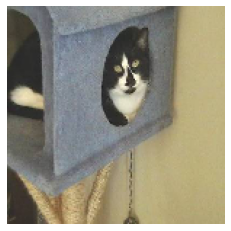

Label:  cat
Previsão:  cat
Probabilidade:  0.45986384


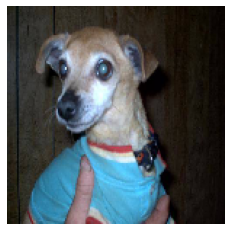

Label:  dog
Previsão:  cat
Probabilidade:  0.40052113


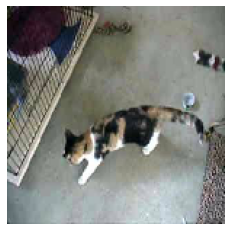

Label:  cat
Previsão:  dog
Probabilidade:  0.63830334


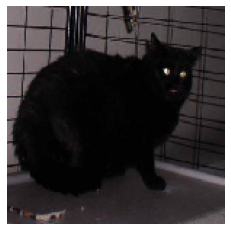

Label:  cat
Previsão:  cat
Probabilidade:  0.11155939


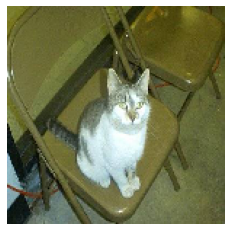

Label:  cat
Previsão:  dog
Probabilidade:  0.6633624


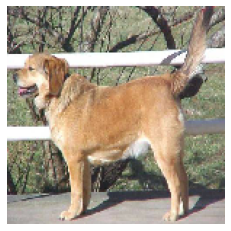

Label:  dog
Previsão:  dog
Probabilidade:  0.75044143


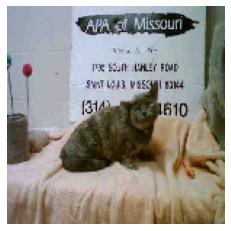

Label:  cat
Previsão:  dog
Probabilidade:  0.57320255


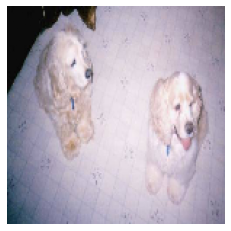

Label:  dog
Previsão:  cat
Probabilidade:  0.44673973


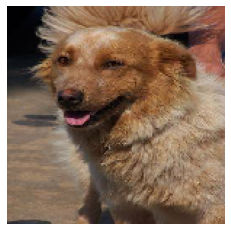

Label:  dog
Previsão:  cat
Probabilidade:  0.4975948


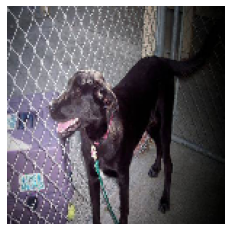

Label:  dog
Previsão:  cat
Probabilidade:  0.4922627


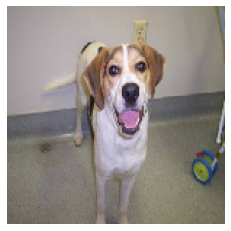

Label:  dog
Previsão:  cat
Probabilidade:  0.41460896


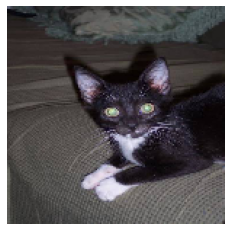

Label:  cat
Previsão:  cat
Probabilidade:  0.3965987


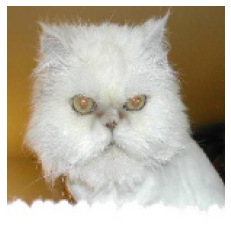

Label:  cat
Previsão:  cat
Probabilidade:  0.49693665


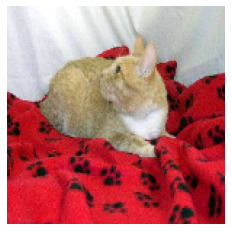

Label:  cat
Previsão:  cat
Probabilidade:  0.48779947


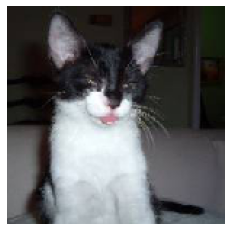

Label:  cat
Previsão:  cat
Probabilidade:  0.3770261


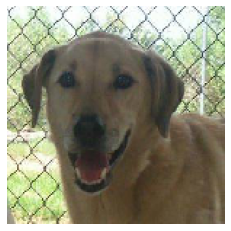

Label:  dog
Previsão:  dog
Probabilidade:  0.7642225


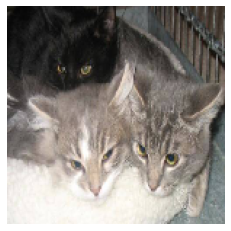

Label:  cat
Previsão:  dog
Probabilidade:  0.5064461


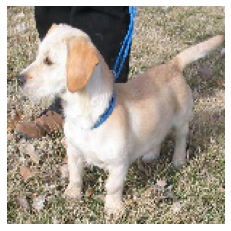

Label:  dog
Previsão:  dog
Probabilidade:  0.82735384


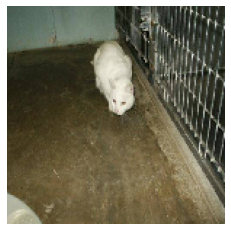

Label:  cat
Previsão:  dog
Probabilidade:  0.5280217


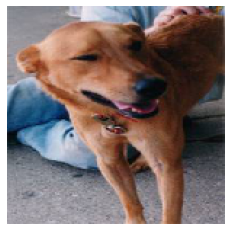

Label:  dog
Previsão:  cat
Probabilidade:  0.46644914


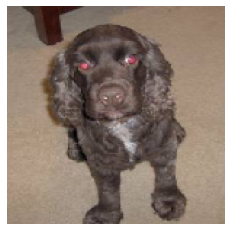

Label:  dog
Previsão:  cat
Probabilidade:  0.44779098


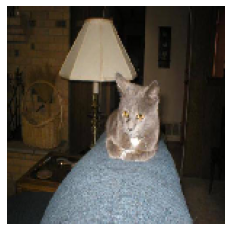

Label:  cat
Previsão:  cat
Probabilidade:  0.39508986


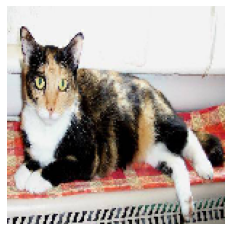

Label:  cat
Previsão:  dog
Probabilidade:  0.6033405


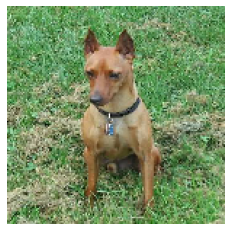

Label:  dog
Previsão:  dog
Probabilidade:  0.9392197


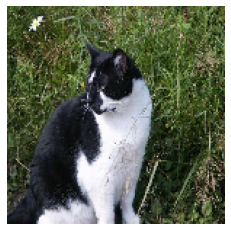

Label:  cat
Previsão:  dog
Probabilidade:  0.7348431


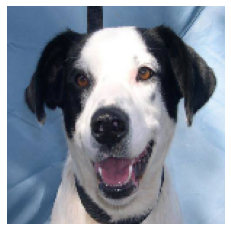

Label:  dog
Previsão:  cat
Probabilidade:  0.49968237


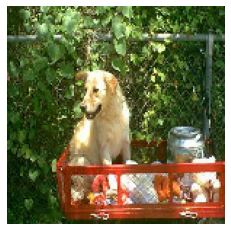

Label:  dog
Previsão:  dog
Probabilidade:  0.85094845


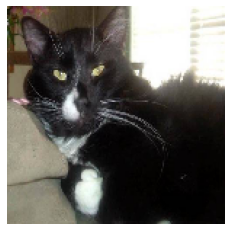

Label:  cat
Previsão:  cat
Probabilidade:  0.31296673


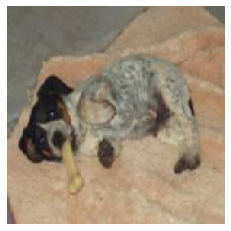

Label:  dog
Previsão:  cat
Probabilidade:  0.49887565


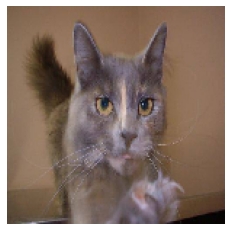

Label:  cat
Previsão:  cat
Probabilidade:  0.41701657


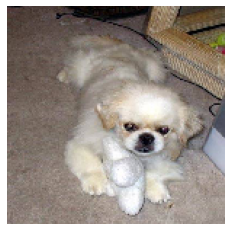

Label:  dog
Previsão:  cat
Probabilidade:  0.4589009


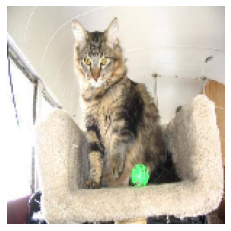

Label:  cat
Previsão:  dog
Probabilidade:  0.5916237


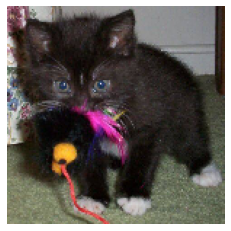

Label:  cat
Previsão:  cat
Probabilidade:  0.3986436


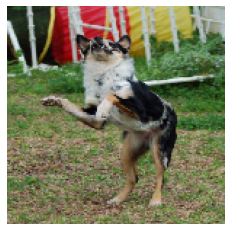

Label:  dog
Previsão:  dog
Probabilidade:  0.8346215


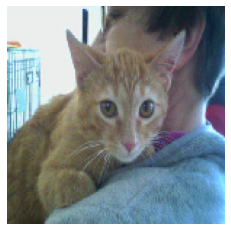

Label:  cat
Previsão:  cat
Probabilidade:  0.48886538


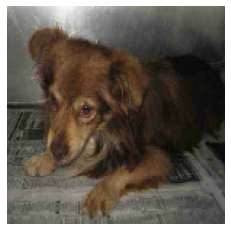

Label:  dog
Previsão:  cat
Probabilidade:  0.42162973


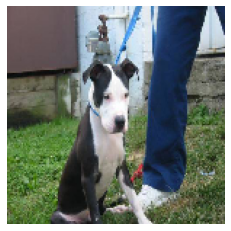

Label:  dog
Previsão:  dog
Probabilidade:  0.76441395


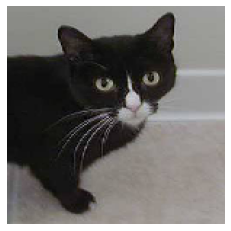

Label:  cat
Previsão:  cat
Probabilidade:  0.34546918


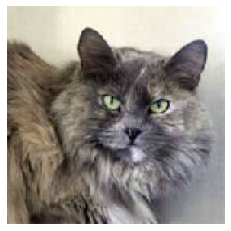

Label:  cat
Previsão:  cat
Probabilidade:  0.47929406


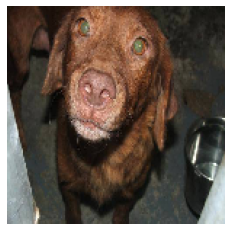

Label:  dog
Previsão:  cat
Probabilidade:  0.41002125


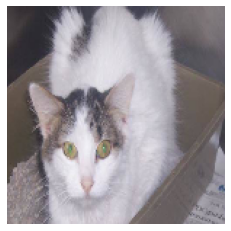

Label:  cat
Previsão:  cat
Probabilidade:  0.45543084


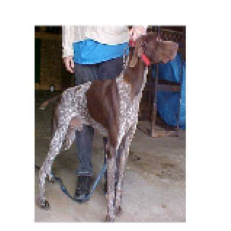

Label:  dog
Previsão:  dog
Probabilidade:  0.5788056


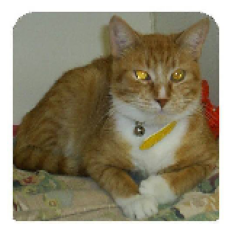

Label:  cat
Previsão:  dog
Probabilidade:  0.56405973


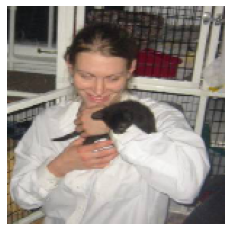

Label:  cat
Previsão:  dog
Probabilidade:  0.523348


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['cat', 'dog']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'dog' if prediction >= 0.5 else 'cat'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

## 6. Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste

In [ ]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

Test: accuracy = 0.616800  ;  loss = 0.670841 


#### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [ ]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.5
Precision:  0.49235993208828516
Recall:  0.5
F1 Score:  0.49441918147995034


Matriz de confusão para identificar onde o modelo de deep learning acertou e errou na classificação do subconjunto de imagens de teste

Matriz de confusão sem normalização


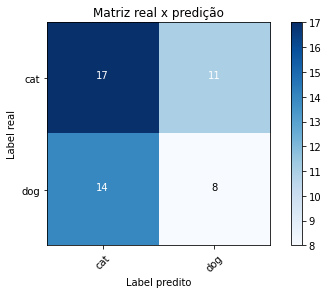

In [ ]:
cnf_matrix = confusion_matrix(y_true, y_pred, labels=class_names)
np.set_printoptions(precision=2)

plt.figure()
plot_confusion_matrix(cnf_matrix,
                      classes=['cat',
                               'dog'],
                      normalize= False,
                      title='Matriz real x predição')

## 7. Exportação do modelo de deep learning para posterior uso

Salvando o modelo de deep learning que foi treinado

In [ ]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/dogs_vs_cats/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-06-19T1422.h5


## 8. Teste do modelo exportado

Carregando o modelo salvo

In [ ]:
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-06-19T1422.h5 carregado com sucesso


Execução do modelo em um subconjunto de imagens de teste

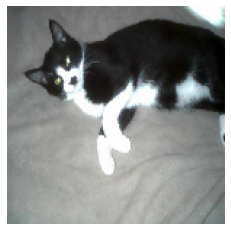

Label:  cat
Previsão:  cat
Probabilidade:  0.3978519


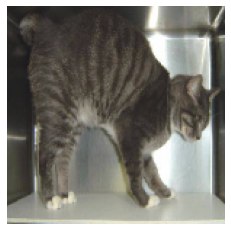

Label:  cat
Previsão:  cat
Probabilidade:  0.47844887


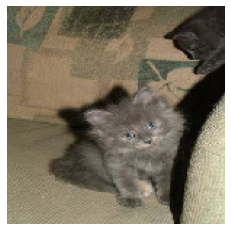

Label:  cat
Previsão:  dog
Probabilidade:  0.5011839


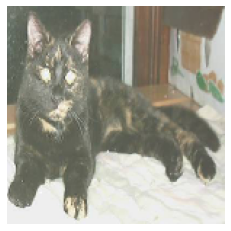

Label:  cat
Previsão:  dog
Probabilidade:  0.59101564


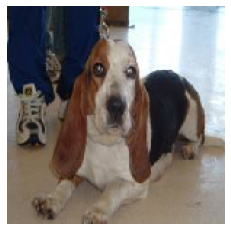

Label:  dog
Previsão:  cat
Probabilidade:  0.46721667


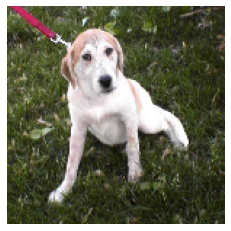

Label:  dog
Previsão:  dog
Probabilidade:  0.8005172


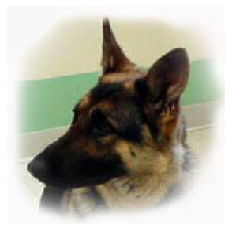

Label:  dog
Previsão:  cat
Probabilidade:  0.42128876


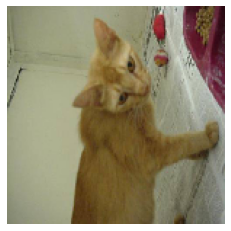

Label:  cat
Previsão:  dog
Probabilidade:  0.5772306


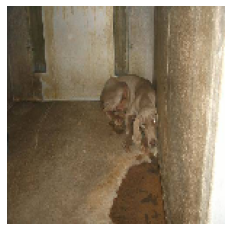

Label:  dog
Previsão:  cat
Probabilidade:  0.4672549


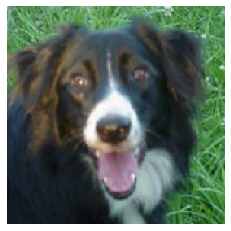

Label:  dog
Previsão:  dog
Probabilidade:  0.52738994


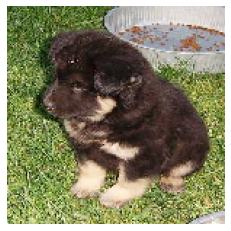

Label:  dog
Previsão:  dog
Probabilidade:  0.9287647


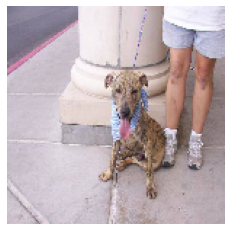

Label:  dog
Previsão:  cat
Probabilidade:  0.46095905


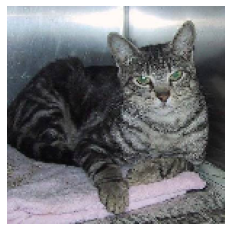

Label:  cat
Previsão:  dog
Probabilidade:  0.50045866


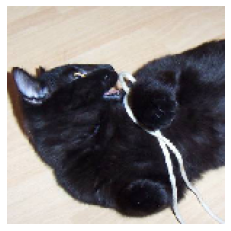

Label:  cat
Previsão:  cat
Probabilidade:  0.4330256


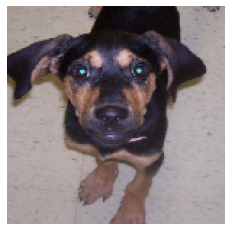

Label:  dog
Previsão:  cat
Probabilidade:  0.43730694


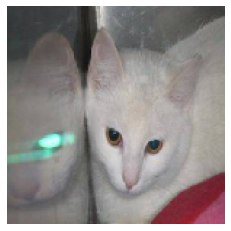

Label:  cat
Previsão:  cat
Probabilidade:  0.4694085


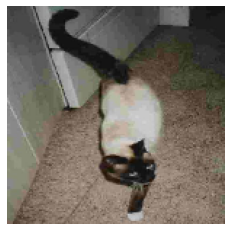

Label:  cat
Previsão:  cat
Probabilidade:  0.480064


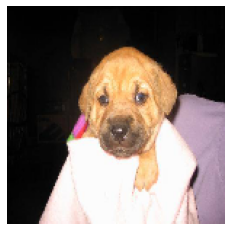

Label:  dog
Previsão:  cat
Probabilidade:  0.3451091


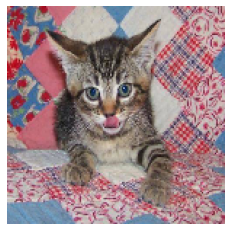

Label:  cat
Previsão:  cat
Probabilidade:  0.48407996


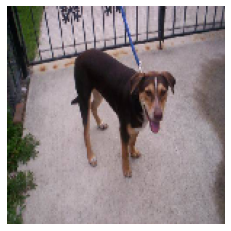

Label:  dog
Previsão:  cat
Probabilidade:  0.44200101


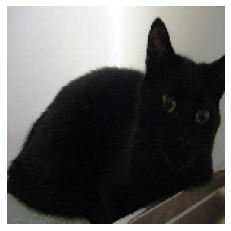

Label:  cat
Previsão:  cat
Probabilidade:  0.16258049


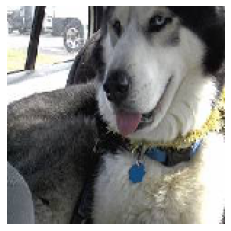

Label:  dog
Previsão:  cat
Probabilidade:  0.4847297


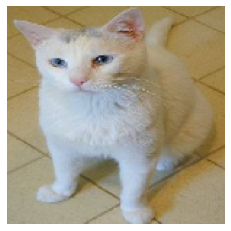

Label:  cat
Previsão:  dog
Probabilidade:  0.51663476


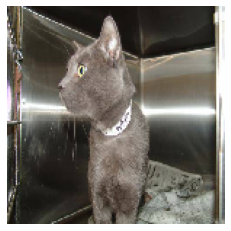

Label:  cat
Previsão:  cat
Probabilidade:  0.40918538


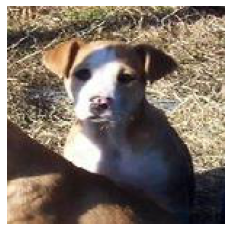

Label:  dog
Previsão:  dog
Probabilidade:  0.650263


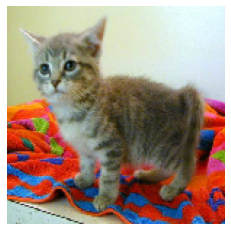

Label:  cat
Previsão:  dog
Probabilidade:  0.6455486


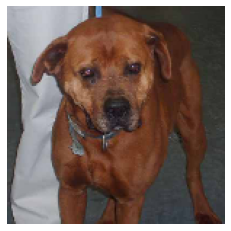

Label:  dog
Previsão:  cat
Probabilidade:  0.4777929


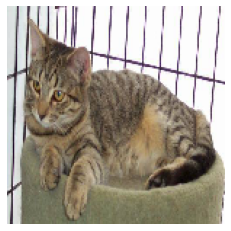

Label:  cat
Previsão:  dog
Probabilidade:  0.66730034


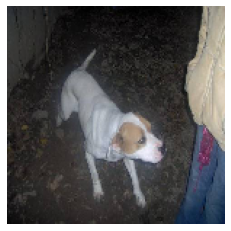

Label:  dog
Previsão:  cat
Probabilidade:  0.4206469


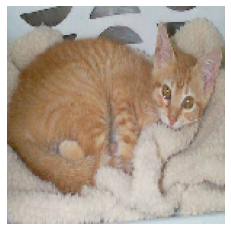

Label:  cat
Previsão:  dog
Probabilidade:  0.5010192


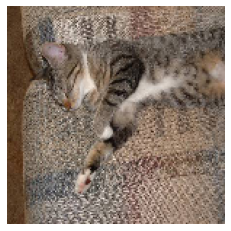

Label:  cat
Previsão:  dog
Probabilidade:  0.73328197


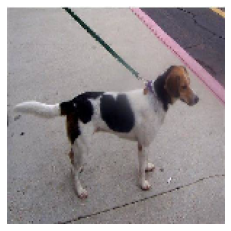

Label:  dog
Previsão:  cat
Probabilidade:  0.44966856


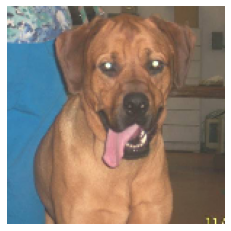

Label:  dog
Previsão:  cat
Probabilidade:  0.47386783


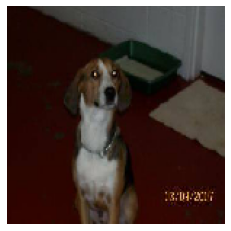

Label:  dog
Previsão:  cat
Probabilidade:  0.28345662


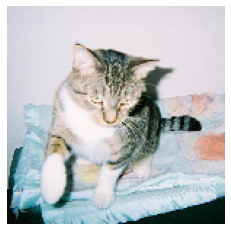

Label:  cat
Previsão:  cat
Probabilidade:  0.47410855


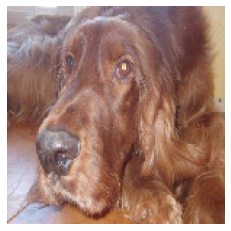

Label:  dog
Previsão:  cat
Probabilidade:  0.47391877


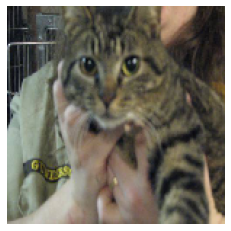

Label:  cat
Previsão:  dog
Probabilidade:  0.5494716


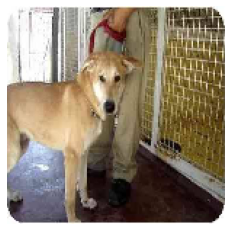

Label:  dog
Previsão:  dog
Probabilidade:  0.52756244


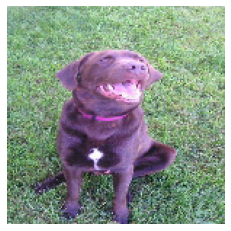

Label:  dog
Previsão:  dog
Probabilidade:  0.8700666


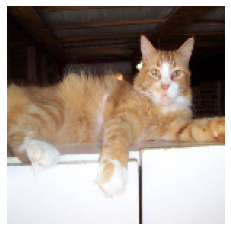

Label:  cat
Previsão:  cat
Probabilidade:  0.46351114


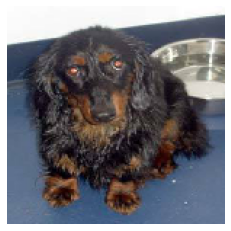

Label:  dog
Previsão:  cat
Probabilidade:  0.49228406


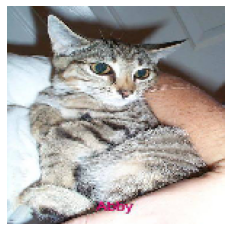

Label:  cat
Previsão:  dog
Probabilidade:  0.6132242


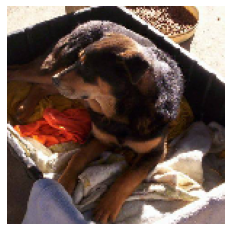

Label:  dog
Previsão:  dog
Probabilidade:  0.58233666


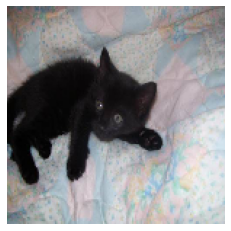

Label:  cat
Previsão:  cat
Probabilidade:  0.42871666


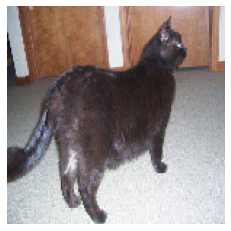

Label:  cat
Previsão:  dog
Probabilidade:  0.5090013


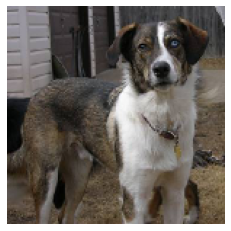

Label:  dog
Previsão:  cat
Probabilidade:  0.44871888


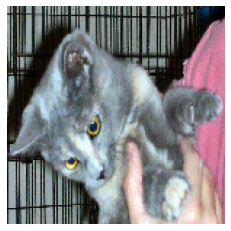

Label:  cat
Previsão:  dog
Probabilidade:  0.6953757


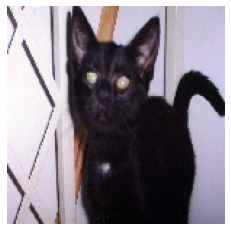

Label:  cat
Previsão:  cat
Probabilidade:  0.35310245


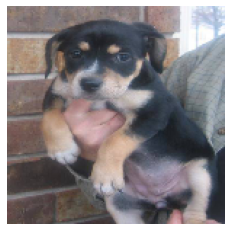

Label:  dog
Previsão:  cat
Probabilidade:  0.43995315


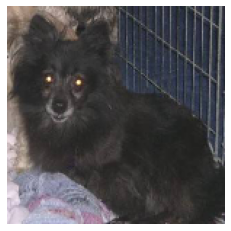

Label:  dog
Previsão:  cat
Probabilidade:  0.3872382


In [ ]:
count = 0
y_pred = list()
y_true = list()
class_names = ['cat', 'dog']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'dog' if prediction >= 0.5 else 'cat'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)